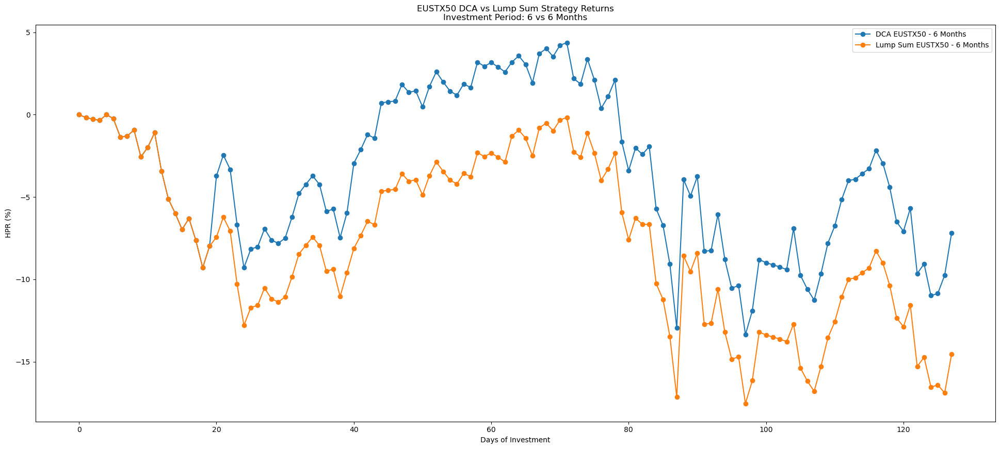

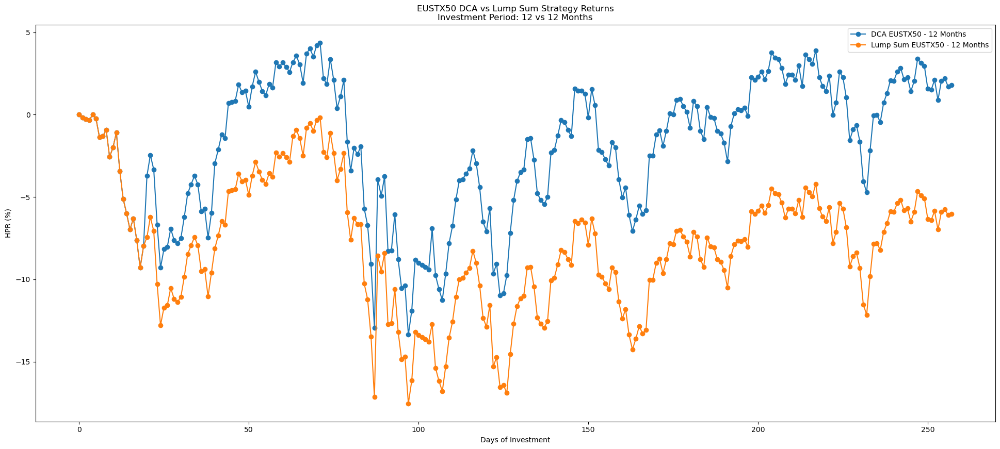

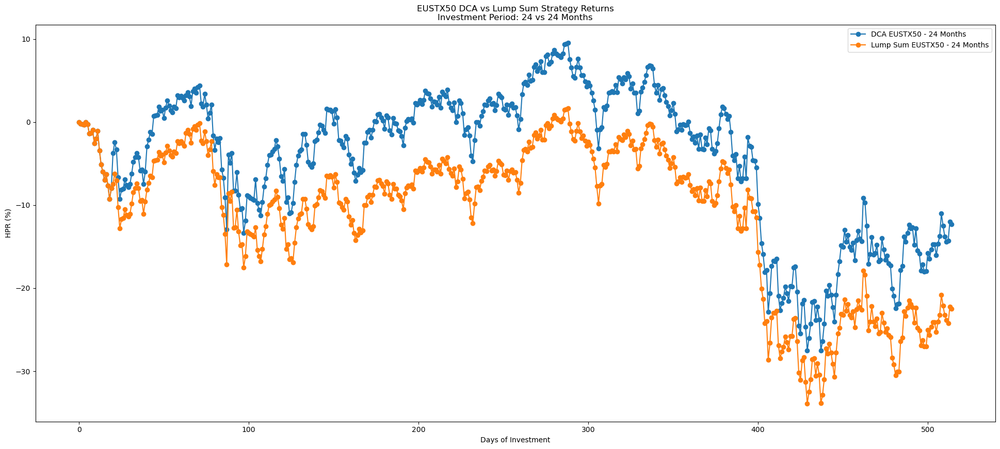

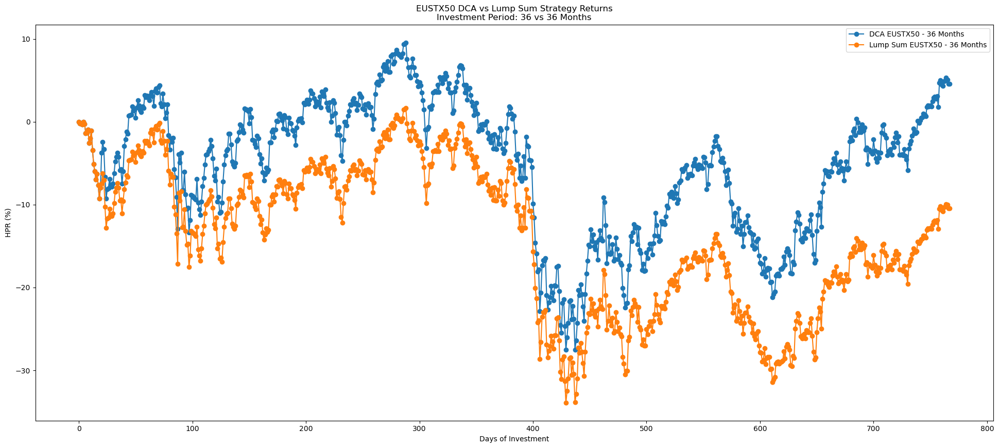

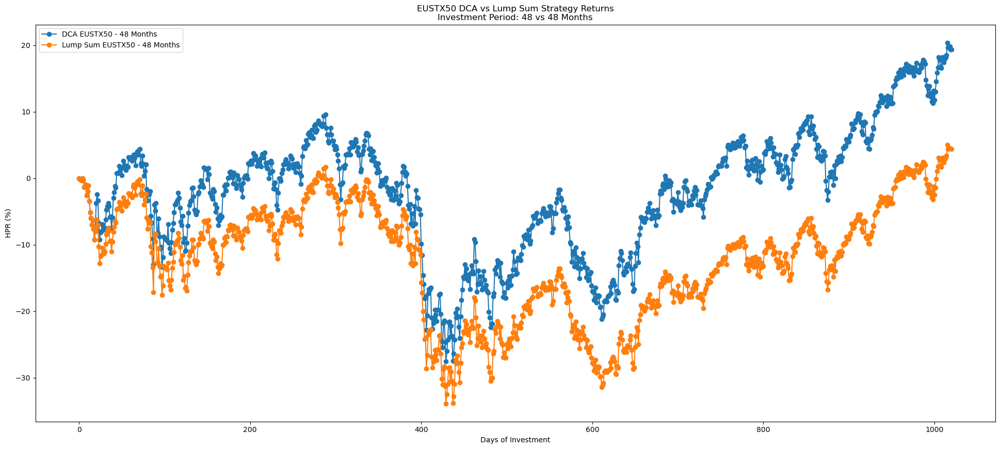

...

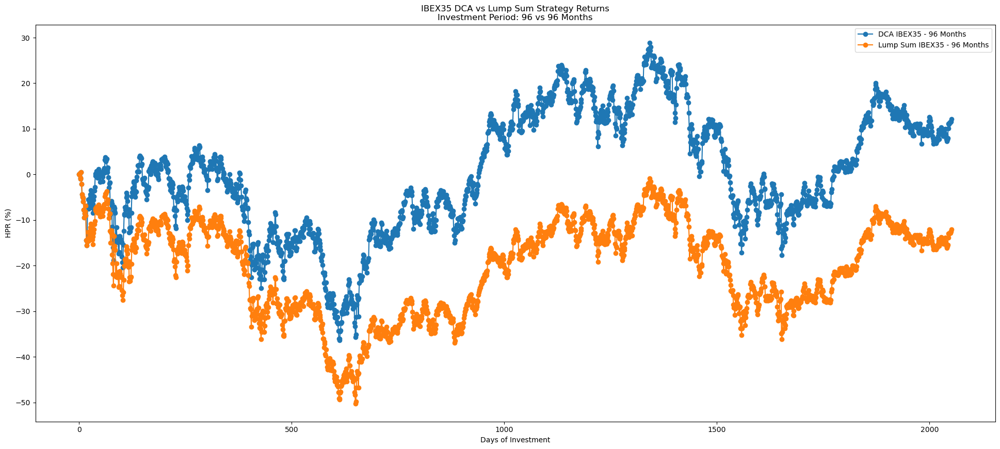

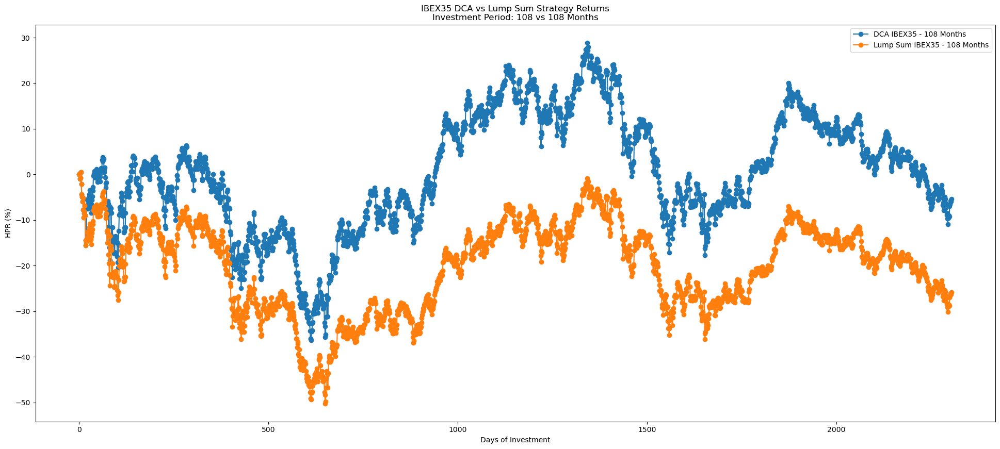

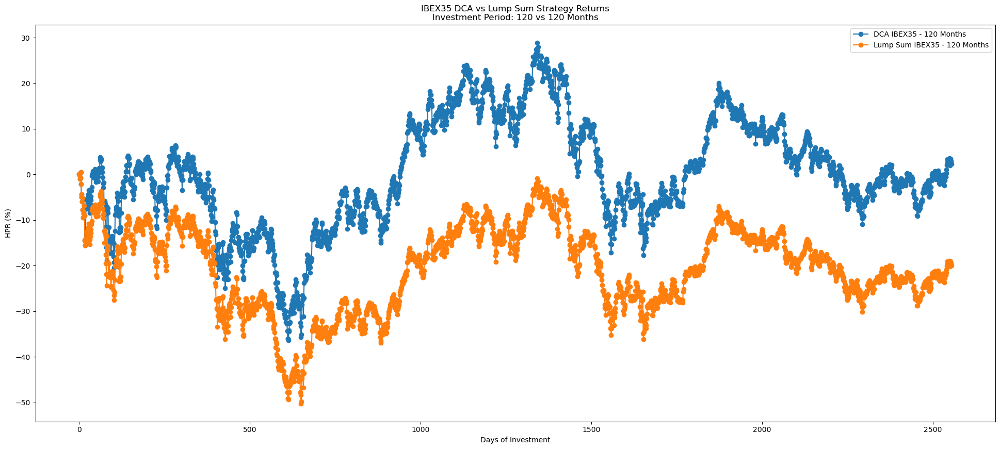

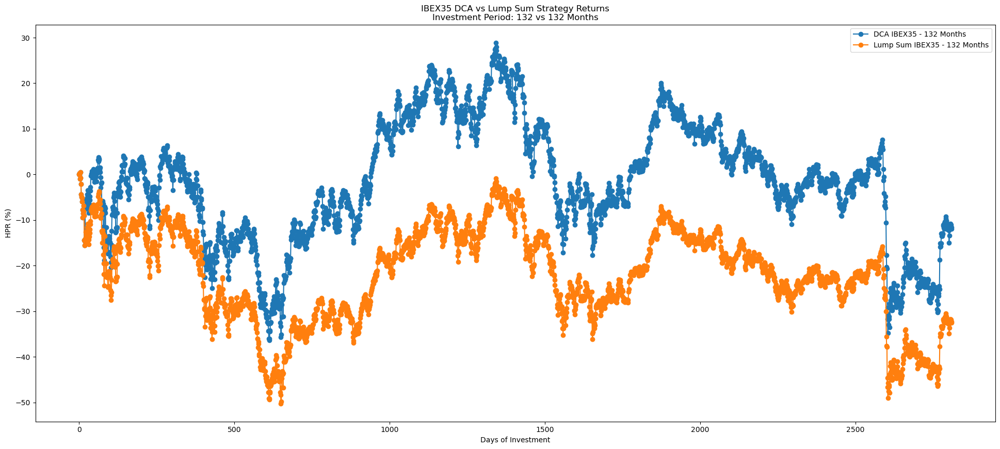

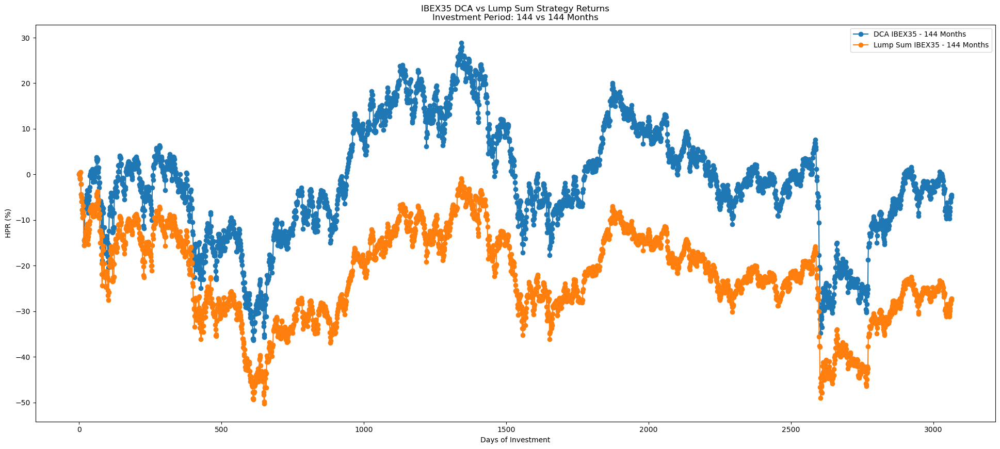

DCA Final Returns:
EUSTX50 - Investment Period 6 Months: -7.20%
EUSTX50 - Investment Period 12 Months: 1.79%
EUSTX50 - Investment Period 24 Months: -12.29%
EUSTX50 - Investment Period 36 Months: 4.60%
EUSTX50 - Investment Period 48 Months: 19.32%
EUSTX50 - Investment Period 60 Months: 25.66%
EUSTX50 - Investment Period 72 Months: 2.62%
EUSTX50 - Investment Period 84 Months: 16.80%
EUSTX50 - Investment Period 96 Months: 17.62%
EUSTX50 - Investment Period 108 Months: 12.32%
EUSTX50 - Investment Period 120 Months: 7.44%
EUSTX50 - Investment Period 132 Months: 25.98%
EUSTX50 - Investment Period 144 Months: 38.41%
CAC40 - Investment Period 6 Months: -4.41%
CAC40 - Investment Period 12 Months: 5.26%
CAC40 - Investment Period 24 Months: -11.64%
CAC40 - Investment Period 36 Months: 5.08%
CAC40 - Investment Period 48 Months: 17.49%
CAC40 - Investment Period 60 Months: 21.58%
CAC40 - Investment Period 72 Months: 6.21%
CAC40 - Investment Period 84 Months: 22.41%
CAC40 - Investment Period 96 Month

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
df = pd.read_csv('europedailyprices (1).csv')

def calculate_sharpe_ratio(final_return, returns):
    # Assuming risk-free rate is zero
    risk_free_rate = 0.0

    # Calculate excess return using the final return
    excess_return = final_return - risk_free_rate

    # Calculate standard deviation of returns
    volatility = returns.std()

    # Calculate Sharpe ratio
    sharpe_ratio = excess_return / (volatility *  252**0.5)

    return sharpe_ratio

def calculate_sortino_ratio(final_return, returns):
    # Assuming risk-free rate is zero
    risk_free_rate = 0.0

    # Calculate downside deviation
    downside_deviation = returns[returns < 0].std()

    # Calculate Sortino ratio using the final return
    sortino_ratio = final_return / (downside_deviation *  252**0.5)

    return sortino_ratio

def kahneman_tversky_valuation(x, alpha=0.88, lambda_=2.25):
    if x >= 0:
        return x ** alpha
    else:
        return -lambda_ * (-x) ** alpha

def dca_strategy(df, index_column, monthly_investment, investment_period):
    # Convert the "Date" column to datetime format
    df['Date'] = pd.to_datetime(df['Date'])

    # Create a new column for the number of shares bought
    df['Shares'] = 0.0

    # Initialize a new column for the investment amount
    df['Investment'] = 0.0

    # Initialize a new column for the cumulative invested amount
    df['Invested Amount'] = 0.0

    # Set the monthly investment amount
    monthly_investment = 100

    # Initialize a variable to keep track of accumulated shares
    accumulated_shares = 0.0

    # Iterate through each row and apply DCA strategy for the specified index
    for i, row in df.iterrows():
        # Check if it's the first day of the month and set the investment value
        if i == 0 or row['Date'].month != df['Date'].iloc[i - 1].month:
            df.at[i, 'Investment'] = monthly_investment
            accumulated_shares += df.at[i, 'Investment'] / row[index_column]

        # Assign the accumulated shares to the 'Shares' column
        df.at[i, 'Shares'] = accumulated_shares

        # Update the 'Invested Amount' column
        df.at[i, 'Invested Amount'] = df.at[i, 'Investment'] + df.at[i - 1, 'Invested Amount'] if i > 0 else df.at[i, 'Investment']

    # Calculate the daily portfolio value for the specified index
    df['Portfolio Value'] = df['Shares'] * df[index_column]

    # Calculate daily returns
    df['Daily Returns'] = (df['Portfolio Value'] / df['Invested Amount'] - 1) * 100
    
    # Extract the relevant data for the specified investment period
    start_date = df['Date'].min()
    end_date = start_date + pd.DateOffset(months=investment_period)
    relevant_data = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]
    
    # Calculate and return the final return
    final_return = relevant_data['Daily Returns'].iloc[-1]
    return final_return, relevant_data['Daily Returns']

def lump_sum_strategy(df, index_column, investment_period):
    # Convert the "Date" column to datetime format
    df['Date'] = pd.to_datetime(df['Date'])

    # Set the lump sum investment amount per month
    monthly_investment = 100

    # Calculate the total investment for the specified period
    total_investment = monthly_investment * investment_period

    # Calculate the number of shares bought on the first day
    initial_shares = total_investment / df.loc[0, index_column]

    # Calculate the daily portfolio value for the specified index
    df['Portfolio Value'] = initial_shares * df[index_column]

    # Calculate daily returns
    df['Daily Returns'] = (df['Portfolio Value'] / total_investment - 1) * 100

    # Extract the relevant data for the specified investment period
    start_date = df['Date'].min()
    end_date = start_date + pd.DateOffset(months=investment_period)
    relevant_data = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]
    
    # Calculate and return the final return
    final_return = relevant_data['Daily Returns'].iloc[-1]
    return final_return, relevant_data['Daily Returns']

# Test different investment periods for DCA (in months)
investment_periods_dca = [6, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120, 132, 144]

# Test different investment periods for lump sum (in months)
investment_periods_lump_sum = [6, 12, 24, 36, 48, 60, 72, 84, 96, 108,  120, 132, 144]

# List of index columns
index_columns = ['EUSTX50', 'CAC40', 'DAX', 'IT40', 'IBEX35']

# Store the results in dictionaries
results_dca = {}
results_lump_sum = {}
sharpe_ratios_dca = {}
sharpe_ratios_lump_sum = {}
sortino_ratios_dca = {}
sortino_ratios_lump_sum = {}
valuations_dca = {}
valuations_lump_sum = {}

# Iterate over each index column
for index_column in index_columns:
    # Iterate over each investment period
    for period_dca, period_lump_sum in zip(investment_periods_dca, investment_periods_lump_sum):
        # DCA results
        final_return_dca, daily_returns_dca = dca_strategy(df.copy(), index_column, 100, period_dca)
        results_dca[f'{index_column} - Investment Period {period_dca} Months'] = final_return_dca
        sharpe_ratio_dca = calculate_sharpe_ratio(final_return_dca, daily_returns_dca)
        sharpe_ratios_dca[f'{index_column} - Investment Period {period_dca} Months'] = sharpe_ratio_dca
        sortino_ratio_dca = calculate_sortino_ratio(final_return_dca, daily_returns_dca)
        sortino_ratios_dca[f'{index_column} - Investment Period {period_dca} Months'] = sortino_ratio_dca

        # Lump sum results
        final_return_lump_sum, daily_returns_lump_sum = lump_sum_strategy(df.copy(), index_column, period_lump_sum)
        results_lump_sum[f'{index_column} - Investment Period {period_lump_sum} Months'] = final_return_lump_sum
        sharpe_ratio_lump_sum = calculate_sharpe_ratio(final_return_lump_sum, daily_returns_lump_sum)
        sharpe_ratios_lump_sum[f'{index_column} - Investment Period {period_lump_sum} Months'] = sharpe_ratio_lump_sum
        sortino_ratio_lump_sum = calculate_sortino_ratio(final_return_lump_sum, daily_returns_lump_sum)
        sortino_ratios_lump_sum[f'{index_column} - Investment Period {period_lump_sum} Months'] = sortino_ratio_lump_sum

        # Apply the valuation function to DCA and Lump Sum final returns
        valuation_dca = kahneman_tversky_valuation(final_return_dca)
        valuation_lump_sum = kahneman_tversky_valuation(final_return_lump_sum)

        # Store the valuations in dictionaries
        valuations_dca[f'{index_column} - Investment Period {period_dca} Months'] = valuation_dca
        valuations_lump_sum[f'{index_column} - Investment Period {period_lump_sum} Months'] = valuation_lump_sum

        # Plotting for each investment period
        plt.figure(figsize=(24, 10))

        # Plot DCA strategy returns
        plt.plot(daily_returns_dca.index, daily_returns_dca, label=f'DCA {index_column} - {period_dca} Months', marker='o')

        # Plot lump sum strategy returns
        plt.plot(daily_returns_lump_sum.index, daily_returns_lump_sum, label=f'Lump Sum {index_column} - {period_lump_sum} Months', marker='o')

        # Adding labels and title
        plt.xlabel('Days of Investment')
        plt.ylabel('HPR (%)')
        plt.title(f'{index_column} DCA vs Lump Sum Strategy Returns\nInvestment Period: {period_dca} vs {period_lump_sum} Months')
        plt.legend()

        # Show the plot
        plt.show()

# Print or visualize the final returns, Sharpe ratios, and Sortino ratios for each strategy and each time frame
print("DCA Final Returns:")
for period, result in results_dca.items():
    print(f"{period}: {result:.2f}%")

print("\nDCA Sharpe Ratios:")
for period, sharpe_ratio in sharpe_ratios_dca.items():
    print(f"{period}: {sharpe_ratio:.4f}")

print("\nDCA Sortino Ratios:")
for period, sortino_ratio in sortino_ratios_dca.items():
    print(f"{period}: {sortino_ratio:.4f}")

print("\nLump Sum Final Returns:")
for period, result in results_lump_sum.items():
    print(f"{period}: {result:.2f}%")

print("\nLump Sum Sharpe Ratios:")
for period, sharpe_ratio in sharpe_ratios_lump_sum.items():
    print(f"{period}: {sharpe_ratio:.4f}")

print("\nLump Sum Sortino Ratios:")
for period, sortino_ratio in sortino_ratios_lump_sum.items():
    print(f"{period}: {sortino_ratio:.4f}")

print("DCA Valuations:")
for period, valuation in valuations_dca.items():
    print(f"{period}: {valuation:.2f}")

print("\nLump Sum Valuations:")
for period, valuation in valuations_lump_sum.items():
    print(f"{period}: {valuation:.2f}")
